In [1]:
from __future__ import division, print_function

In [2]:
import numpy as np
import matplotlib.pyplot as plt

import h5py
from ktransit import FitTransit, LCModel


%matplotlib inline

In [3]:
fn = '../mcmc/koi1_np4_priorTrue_dil0_circTrue.hdf5'
f = h5py.File(fn)

fn1 = '../mcmc/koi1_np4_priorTrue_dil0_circFalse.hdf5'
f1 = h5py.File(fn1)

In [4]:
g = f['mcmc']['chain']
g1 = f1['mcmc']['chain']

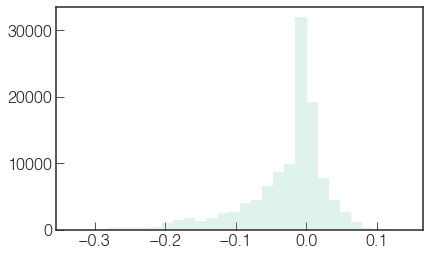

In [5]:
x = 15
# q = plt.hist(g[:,-550:,x].flatten(),bins=30,alpha=0.2)
q = plt.hist(g1[:,-550:,x].flatten(),bins=30,alpha=0.2)

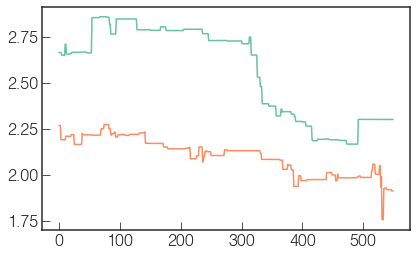

In [6]:
plt.plot(g1[0,-550:,0])
plt.plot(g1[150,-550:,0])

In [7]:
import corner
gg = np.reshape(g1[:,-550::100,:], [-1,29])

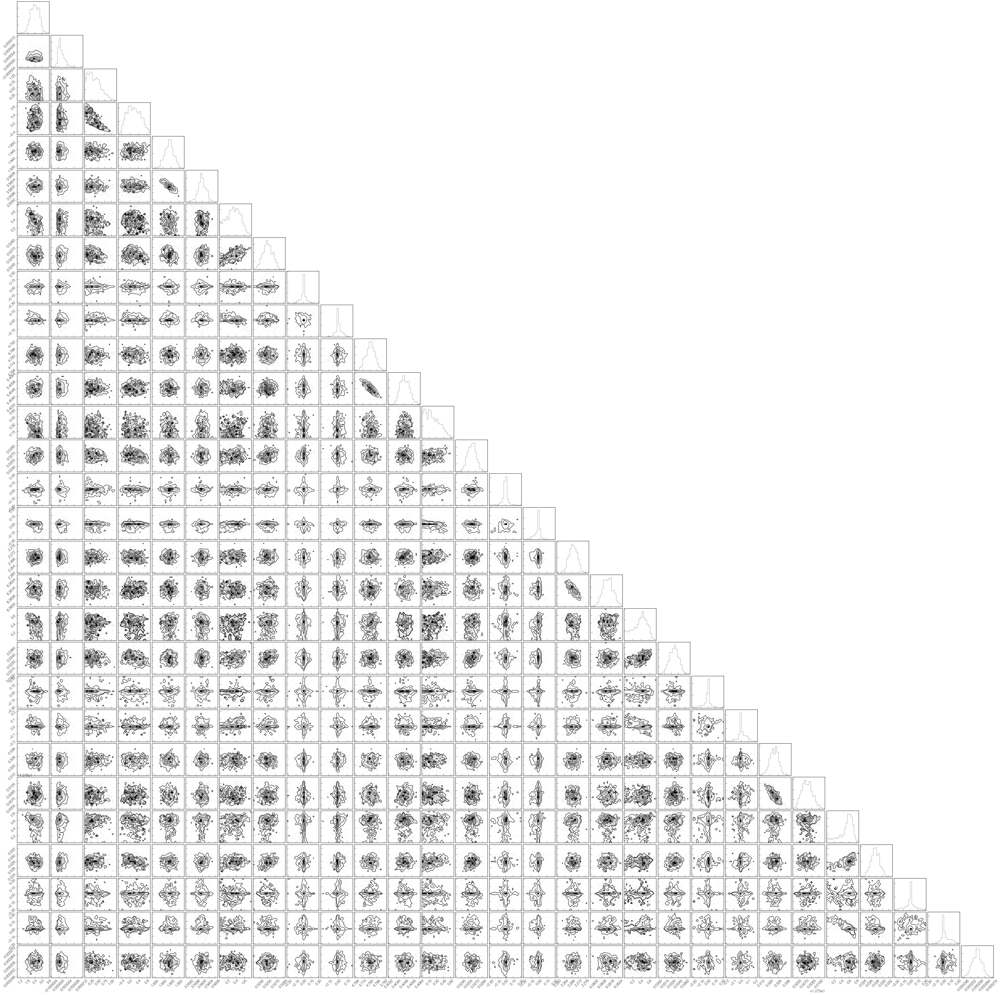

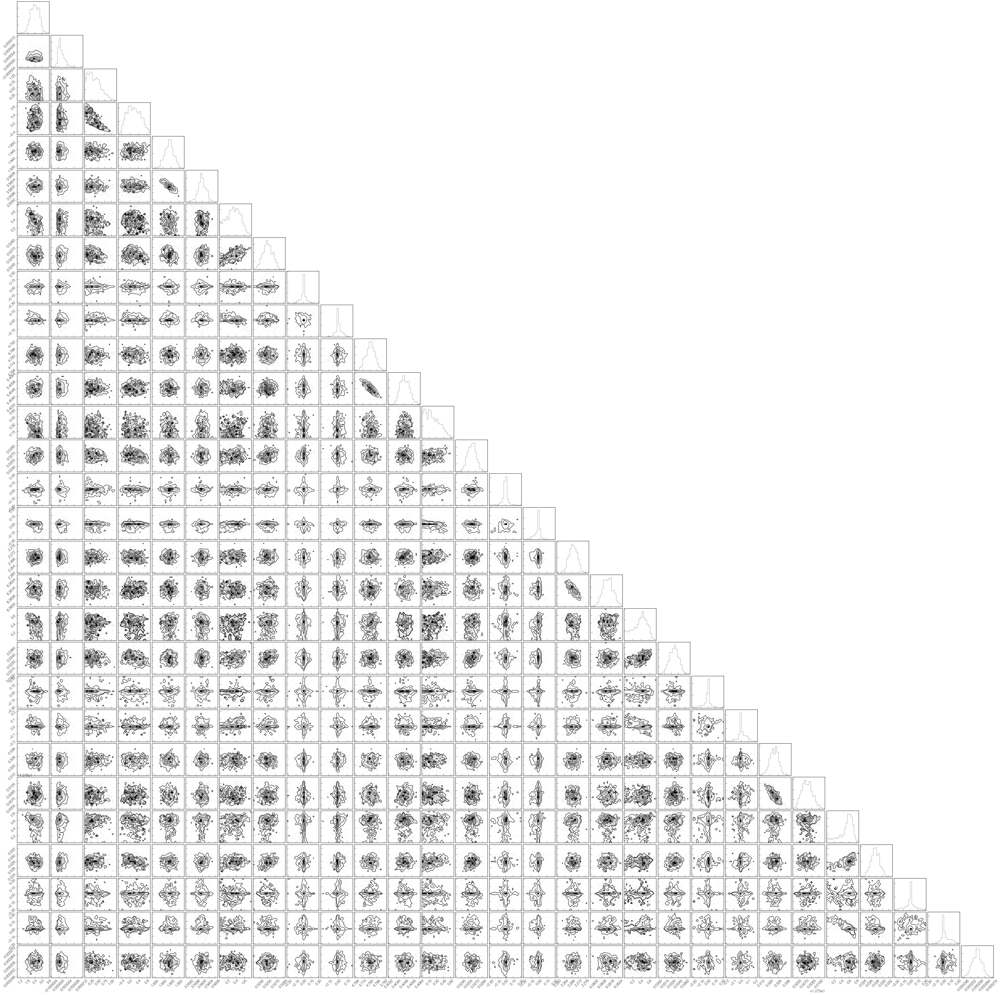

In [19]:
gg.shape
corner.corner(gg)

In [8]:
for i in range(29):
    v = np.percentile(g1[:,-550::100,i].flatten(),[15.9, 50, 84.1])
    print('${:.5f}^+{:.5f}_-{:.5f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$2.34345^+0.25160_-0.25484$
$0.00000^+0.00001_-0.00000$
$0.38858^+0.26583_-0.25651$
$0.09406^+0.37954_-0.27975$
$1.94432^+0.00281_-0.00304$
$3.55995^+0.00025_-0.00023$
$0.34320^+0.15848_-0.22744$
$0.02541^+0.00102_-0.00097$
$0.00034^+0.07878_-0.03905$
$0.00357^+0.05209_-0.02363$
$4.78017^+0.00362_-0.00360$
$5.40486^+0.00045_-0.00041$
$0.23317^+0.17506_-0.15721$
$0.02659^+0.00098_-0.00107$
$0.00007^+0.06099_-0.04440$
$-0.00542^+0.01927_-0.07119$
$2.26874^+0.00241_-0.00247$
$8.26131^+0.00047_-0.00048$
$0.39092^+0.13249_-0.21849$
$0.03354^+0.00110_-0.00112$
$-0.00014^+0.05627_-0.06406$
$0.01048^+0.06301_-0.02290$
$0.32483^+0.00371_-0.00375$
$12.75735^+0.00109_-0.00119$
$0.58638^+0.09199_-0.26436$
$0.02804^+0.00114_-0.00129$
$-0.00108^+0.05843_-0.11750$
$0.01009^+0.12256_-0.03698$
$0.00026^+0.00000_-0.00000$


In [28]:
for i in [4,10,16,22]:
    v = np.percentile(g1[:,-550::100,i].flatten() + 2457738.376807,[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$2457740.3209^+0.0027_-0.0030$
$2457743.1572^+0.0038_-0.0044$
$2457740.6456^+0.0026_-0.0024$
$2457738.7010^+0.0040_-0.0042$


In [38]:
l = len(g1[:,-550::100,0].flatten())
for i in [7,13,19,25]:
    p = g1[:,-550::100,i].flatten() * np.random.normal(0.82, 0.07, size=l) / 0.009155
    v = np.percentile(p,[15.9, 50, 84.1])
    print('${:.2f}^+{:.2f}_-{:.2f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$2.28^+0.22_-0.22$
$2.37^+0.24_-0.22$
$3.00^+0.27_-0.28$
$2.50^+0.24_-0.25$


In [39]:
def get_ar(rho,period):
    """ gets a/R* from period and mean stellar density"""
    G = 6.67E-11
    rho_SI = rho * 1000.
    tpi = 3. * np.pi
    period_s = period * 86400.
    part1 = period_s**2 * G * rho_SI
    ar = (part1 / tpi)**(1./3.)
    return ar

In [42]:
for i in [5,11,17,23]:
    p = get_ar(g1[:,-550::100,0].flatten(),g1[:,-550::100,i].flatten())
    v = np.percentile(p,[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$11.6198^+0.4011_-0.4373$
$15.3491^+0.5308_-0.5764$
$20.3673^+0.7051_-0.7665$
$27.2100^+0.9409_-1.0249$


In [40]:
for i in [5,11,17,23]:
    p = get_ar(g1[:,-550::100,0].flatten(),g1[:,-550::100,i].flatten()) * np.random.normal(0.82, 0.07, size=l) * 0.00464913034
    v = np.percentile(p,[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$0.0443^+0.0038_-0.0043$
$0.0585^+0.0056_-0.0055$
$0.0773^+0.0074_-0.0071$
$0.1035^+0.0098_-0.0100$


In [43]:
print(np.percentile(np.sqrt(g1[:,-550::100,8].flatten()**2+g1[:,-550::100,9].flatten()**2 ),[99.73]))
print(np.percentile(np.sqrt(g1[:,-550::100,14].flatten()**2+g1[:,-550::100,15].flatten()**2 ),[99.73]))
print(np.percentile(np.sqrt(g1[:,-550::100,20].flatten()**2+g1[:,-550::100,21].flatten()**2 ),[99.73]))
print(np.percentile(np.sqrt(g1[:,-550::100,26].flatten()**2+g1[:,-550::100,27].flatten()**2 ),[99.73]))


[ 0.33314073]
[ 0.32571505]
[ 0.32872888]
[ 0.33437224]


In [46]:
print(np.percentile(np.sqrt(g1[:,-550::100,8].flatten()**2+g1[:,-550::100,9].flatten()**2 ),[97.7]))
print(np.percentile(np.sqrt(g1[:,-550::100,14].flatten()**2+g1[:,-550::100,15].flatten()**2 ),[97.7]))
print(np.percentile(np.sqrt(g1[:,-550::100,20].flatten()**2+g1[:,-550::100,21].flatten()**2 ),[97.7]))
print(np.percentile(np.sqrt(g1[:,-550::100,26].flatten()**2+g1[:,-550::100,27].flatten()**2 ),[97.7]))


[ 0.28714366]
[ 0.27853726]
[ 0.28068667]
[ 0.31318624]


In [49]:
# insolation

for i in [5,11,17,23]:
    p = get_ar(g1[:,-550::100,0].flatten(),g1[:,-550::100,i].flatten())
    teff = np.random.normal(5144,76,size=l)
    
    v = (teff/5778)**4 * (215.1/p)**2
    
    v = np.percentile(v,[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$215.4718^+21.5434_-18.9786$
$123.4006^+11.8611_-10.9955$
$70.3587^+6.6234_-6.3426$
$39.5518^+3.7639_-3.7175$


In [34]:
def get_qf(time,flux,epoch,period,transitmodel=None):
    date1 = (time - epoch) + 0.5*period
    phi1 = (((date1 / period) - np.floor(date1/period)) * period) - 0.5*period
    q1 = np.sort(phi1)
    f1 = (flux[np.argsort(phi1)]) * -1.E6
    if transitmodel is not None:
        m1 = (transitmodel[np.argsort(phi1)]) * -1.E6
        return q1,f1,m1
    else:
        return q1,f1

def plot_model(ax,time,flux, rho, zpt, ld1, ld2, T0, period, impact,rprs, cadence='long'):

    q1, f1 = get_qf(time,flux,T0,period)

    model = model_ktransit(time, rho, zpt, ld1, ld2, T0, period, impact,rprs, cadence=cadence)
    q1, m1 = get_qf(time,model,T0,period)
    ax.scatter(q1*24., f1/10000,color='k',alpha=period**0.5/5,s=4
              )
    ax.plot(q1*24., m1/10000,color='r')
    bq, bf, be = bin_data(q1,f1,bins=100.//period)
    ax.errorbar(bq*24., bf/10000, yerr=be/10000, ls='',color='b')
    ax.set_xlim([-4,4])
    ax.set_ylim([1.19,-0.75])
    #ax.set_xlabel('Time from mid-transit (days)')
    ax.set_ylabel('Transit depth (%)', fontsize=17)
    ax.minorticks_on()
    return ax

def bin_data(phi,flux,bins,model=None):
    phi = np.array(phi)
    flux = np.array(flux)
    phibin = []
    fluxbin = []
    stdbin = []
    bins=int(bins)
    for i in (bins*np.arange(len(phi)//bins))+(bins//2):
        if model == None:
            goodpoints = np.ones(len(flux),dtype=bool)
        else:
            goodpoints = flux-model < 3* np.std(flux-model)
        flux2 = flux[goodpoints]
        phi2 = phi[goodpoints]
        phibin.append(np.median(phi2[i-bins//2:i+bins//2]))
        fluxbin.append(np.median(flux2[i-bins//2:i+bins//2]))
        stdbin.append(np.std(flux2[i-bins//2:i+bins//2]))
    return np.array(phibin), np.array(fluxbin), np.array(stdbin) / np.sqrt(bins)

def model_ktransit(time, rho, zpt, ld1, ld2, T0, period, impact,rprs, cadence):
    M = LCModel()
    M.add_star(rho=rho,zpt=zpt,ld1=ld1,
            ld2=ld2,dil=0)
    M.add_planet(T0=T0,
                 period=period,
                 impact=impact,
                 rprs=rprs
                 )
    if cadence == 'long':
        M.add_data(time=time, itime=np.ones_like(time) * 0.0188)
    elif cadence == 'short':
        M.add_data(time=time, itime=np.ones_like(time) * 0.0188 / 30)
    return M.transitmodel

In [35]:
lnprob = f1['mcmc']['lnprob'][:]
mle_idx = np.unravel_index(lnprob.argmax(),
        lnprob.shape)
mle = g1[mle_idx]

In [36]:
mle

array([  2.36935622e+00,  -7.10906467e-08,   1.85268980e-01,
         5.01670027e-01,   1.94470469e+00,   3.55983411e+00,
         3.93065637e-01,   2.50893413e-02,   1.72884761e-02,
        -4.70624677e-02,   4.78226717e+00,   5.40477412e+00,
         1.77228707e-01,   2.65475890e-02,   5.39698457e-03,
         3.97747235e-03,   2.26760608e+00,   8.26112110e+00,
         4.64673987e-01,   3.33678446e-02,   3.07957466e-08,
         2.65152826e-07,   3.28109371e-01,   1.27564777e+01,
         5.69484092e-01,   2.62496799e-02,  -8.66891322e-04,
        -3.14854728e-04,   2.57291198e-04])

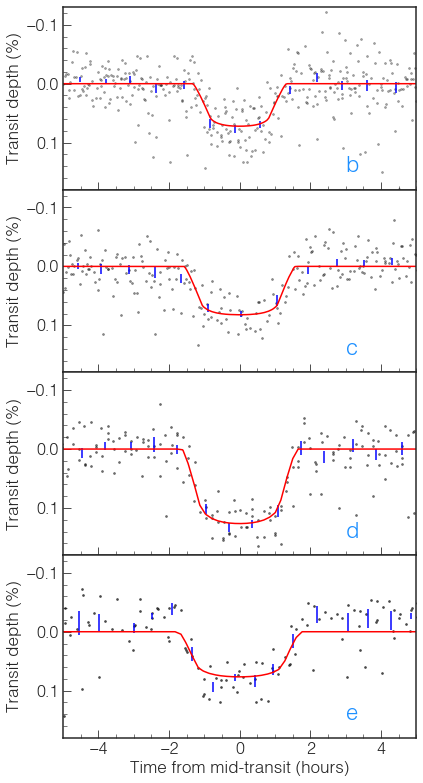

In [38]:
fig, axes = plt.subplots(4,1,figsize=[6,11], )

labels = ['b', 'c', 'd', 'e']
for i, p in enumerate(['pnum0', 'pnum1', 'pnum2', 'pnum3']):
    axes[i] = plot_model(
        axes[i], f1['time'][:], f1['flux'][:], 
        mle[0],
        mle[1],
        mle[2], 
        mle[3],
        mle[4+i*6],
        mle[5+i*6],
        mle[6+i*6],
        mle[7+i*6])
    
    axes[i].set_ylim(0.18,-0.13)
    axes[i].set_xlim(-5,5)
    axes[i].text(3.0,0.15, labels[i], fontsize=22, color='dodgerblue')
    axes[i].tick_params(labelbottom=False, )
    axes[i].tick_params(direction='in', which='both')
axes[-1].tick_params(labelbottom=True)
axes[-1].set_xlabel('Time from mid-transit (hours)', fontsize=17)
fig.subplots_adjust(hspace=0)
plt.tight_layout(h_pad=0)

# fig.savefig('EE1-transitmodel.png')

In [39]:
d = np.genfromtxt('../data/245950175.csv', delimiter=',', skip_header=40, usecols=[0,3,4,5]).T

# dq = np.genfromtxt('../data/245950175.csv', delimiter=',', skip_header=40, usecols=[6,7,8,9], dtype='bool').T

(13, 19)

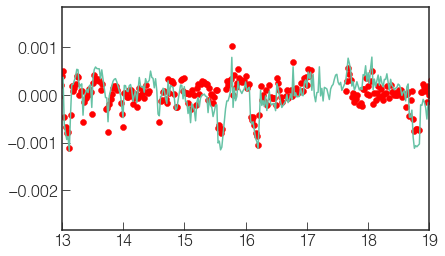

In [104]:
# plt.plot(d[0][~dq[1]], d[1][~dq[1]])
# plt.plot(d[0][~dq[3]], d[3][~dq[3]])
# plt.plot(d[0][~dq[2]], d[3][~dq[2]])
plt.plot(d[0][~dq[2]] - d[0][0], d[3][~dq[2]] / np.median(d[3][~dq[2]])-1.0)

plt.scatter(f1['time'][:] , f1['flux'][:], color='red')

plt.xlim(13,19)

In [112]:
np.savetxt('../data/lc-v2.txt', np.array([d[0][~dq[2]], d[3][~dq[2]]/ np.median(d[3][~dq[2]])]).T)

In [105]:
d[0][~dq[2]]

array([ 2457738.376807,  2457738.397239,  2457738.417672, ...,
        2457815.956217,  2457815.976649,  2457815.997081])

In [110]:
d[0][~dq[2]], d[3][~dq[2]]/ np.median(d[3][~dq[2]])

(array([ 2457738.376807,  2457738.397239,  2457738.417672, ...,
         2457815.956217,  2457815.976649,  2457815.997081]),
 array([ 0.99957456,  0.99983702,  0.99967315, ...,  1.00117016,
         1.00043082,  1.00046841]))

In [121]:
f['mcmc'].attrs.keys()

[u'nwalkers',
 u'burnin',
 u'iterations',
 u'thin',
 u'rho_prior',
 u'ldp_prior',
 u'onlytransits',
 u'tregion',
 u'ldfileloc',
 u'n_ldparams']

In [127]:
f['mcmc'].attrs['iterations']

4200

In [24]:
f1.attrs['rho_0_unc']

0.5

In [9]:
import emcee

In [37]:
emcee.autocorr.integrated_time(g1[0,:,0],)

AutocorrError: The chain is too short to reliably estimate the autocorrelation time